In [4]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
from sklearn.neural_network import MLPClassifier
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical

2025-03-17 17:17:51.201818: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1742228286.449729  162483 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1742228288.746968  162483 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1742228316.155366  162483 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1742228316.155589  162483 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1742228316.155594  162483 computation_placer.cc:177] computation placer alr

In [8]:
data_folder = "/home/feriel/MSDKproject/ai8x-training/data/Apple_varieties/Train"
apple_varieties = {
    "CRIPPSRED": 0,
    "GALA": 1,
    "JULIETTE": 2,
    "STORY": 3
}

In [9]:
data_list = []
labels = []

for variety, label in apple_varieties.items():

    variety_path = os.path.join(data_folder, variety) + "/"
    print("variety_path", variety_path)
    if os.path.exists(variety_path):
        for file in os.listdir(variety_path):
            if file.endswith(".txt"):
                file_path = os.path.join(variety_path, file)
                spectrum = np.loadtxt(file_path)  # Read the .txt file as a NumPy array
                data_list.append(spectrum)
                labels.append(label)
    else:
        print(f"Warning: Folder '{variety}' not found.")



variety_path /home/feriel/MSDKproject/ai8x-training/data/Apple_varieties/Train/CRIPPSRED/
variety_path /home/feriel/MSDKproject/ai8x-training/data/Apple_varieties/Train/GALA/
variety_path /home/feriel/MSDKproject/ai8x-training/data/Apple_varieties/Train/JULIETTE/
variety_path /home/feriel/MSDKproject/ai8x-training/data/Apple_varieties/Train/STORY/


In [10]:
# Convert lists to NumPy arrays
X = np.array(data_list)
y = np.array(labels)

print(f"Dataset Loaded: {X.shape[0]} samples, {X.shape[1]} features (wavelengths).")


Dataset Loaded: 144 samples, 288 features (wavelengths).


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import DataLoader, TensorDataset, random_split
from sklearn.preprocessing import StandardScaler
import numpy as np

# Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
print("x scaled", X_scaled.shape)

# Reshape for 1D CNN (samples, time steps, features)
X_reshaped = np.expand_dims(X_scaled, axis=-1)
print("x reshaped", X_reshaped.shape)

# Convert to PyTorch tensors
X_tensor = torch.tensor(X_reshaped, dtype=torch.float32)
print("x X_tensor", X_tensor.shape)
y_tensor = torch.tensor(y, dtype=torch.long)  # No need for one-hot encoding in PyTorch

# Split data into train and test sets
test_size = int(0.2 * len(X_tensor))
train_size = len(X_tensor) - test_size
train_dataset, test_dataset = random_split(TensorDataset(X_tensor, y_tensor), [train_size, test_size])


# Extract tensors from Subset objects
X_train, y_train = zip(*train_dataset)
X_test, y_test = zip(*test_dataset)

# Convert lists to tensors
X_train = torch.stack(X_train)
y_train = torch.tensor(y_train)  # Ensure y is still a tensor
X_test = torch.stack(X_test)
y_test = torch.tensor(y_test)

# Create DataLoader
batch_size = 1
train_loader = DataLoader(TensorDataset(X_train, y_train), batch_size=batch_size, shuffle=True)
test_loader = DataLoader(TensorDataset(X_test, y_test), batch_size=batch_size, shuffle=False)

# Define 1D CNN model
class CNN1D(nn.Module):
    def __init__(self, num_classes):
        super(CNN1D, self).__init__()
        self.conv1 = nn.Conv1d(in_channels=1, out_channels=32, kernel_size=3, padding=1)
        self.pool = nn.MaxPool1d(kernel_size=2)
        self.conv2 = nn.Conv1d(in_channels=32, out_channels=64, kernel_size=3, padding=1)
        self.conv3 = nn.Conv1d(in_channels=64, out_channels=16, kernel_size=3, padding=1)
        self.flatten = nn.Flatten()
        self.fc1 = nn.Linear(64 * (X_reshaped.shape[1] // 4), 32)
        self.dropout = nn.Dropout(0.3)
        self.fc2 = nn.Linear(32, num_classes)

    def forward(self, x):
        
        x = F.relu(self.conv1(x))
        x = self.pool(x)
        x = F.relu(self.conv2(x))
        x = self.pool(x)
        x = self.flatten(x)
        x = F.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.fc2(x)
        return x

# Initialize model
num_classes = len(apple_varieties)
model = CNN1D(num_classes)

# Define optimizer and loss function
optimizer = optim.Adam(model.parameters(), lr=0.0001)
criterion = nn.CrossEntropyLoss()

# Move to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Training loop
num_epochs = 300
for epoch in range(num_epochs):
    model.train()
    total_loss = 0
    correct = 0
    total = 0

    for X_batch, y_batch in train_loader:
        X_batch, y_batch = X_batch.to(device), y_batch.to(device)
        optimizer.zero_grad()
        outputs = model(X_batch.permute(0, 2, 1))  # PyTorch expects (batch, channels, sequence)
        loss = criterion(outputs, y_batch)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
        
        _, predicted = outputs.max(1)
        correct += (predicted == y_batch).sum().item()
        total += y_batch.size(0)

    train_acc = correct / total
    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {total_loss:.4f}, Accuracy: {train_acc:.4f}")

# Evaluation
model.eval()
correct = 0
total = 0
with torch.no_grad():
    for X_batch, y_batch in test_loader:
        X_batch, y_batch = X_batch.to(device), y_batch.to(device)
        outputs = model(X_batch.permute(0, 2, 1))
        _, predicted = outputs.max(1)
        correct += (predicted == y_batch).sum().item()
        total += y_batch.size(0)

test_acc = correct / total
print(f"Test Accuracy: {test_acc:.4f}")


x scaled (144, 288)
x reshaped (144, 288, 1)
x X_tensor torch.Size([144, 288, 1])
X_batch torch.Size([1, 288, 1])
X_batch torch.Size([1, 288, 1])
X_batch torch.Size([1, 288, 1])
X_batch torch.Size([1, 288, 1])
X_batch torch.Size([1, 288, 1])
X_batch torch.Size([1, 288, 1])
X_batch torch.Size([1, 288, 1])
X_batch torch.Size([1, 288, 1])
X_batch torch.Size([1, 288, 1])
X_batch torch.Size([1, 288, 1])
X_batch torch.Size([1, 288, 1])
X_batch torch.Size([1, 288, 1])
X_batch torch.Size([1, 288, 1])
X_batch torch.Size([1, 288, 1])
X_batch torch.Size([1, 288, 1])
X_batch torch.Size([1, 288, 1])
X_batch torch.Size([1, 288, 1])
X_batch torch.Size([1, 288, 1])
X_batch torch.Size([1, 288, 1])
X_batch torch.Size([1, 288, 1])
X_batch torch.Size([1, 288, 1])
X_batch torch.Size([1, 288, 1])
X_batch torch.Size([1, 288, 1])
X_batch torch.Size([1, 288, 1])
X_batch torch.Size([1, 288, 1])
X_batch torch.Size([1, 288, 1])
X_batch torch.Size([1, 288, 1])
X_batch torch.Size([1, 288, 1])
X_batch torch.Size([1,

KeyboardInterrupt: 

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import DataLoader, TensorDataset, random_split
from sklearn.preprocessing import StandardScaler
import numpy as np

# Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
print("x scaled", X_scaled.shape)

# Reshape for 1D CNN (samples, time steps, features)
X_reshaped = np.expand_dims(X_scaled, axis=-1)
print("x reshaped", X_reshaped.shape)

# Convert to PyTorch tensors
X_tensor = torch.tensor(X_reshaped, dtype=torch.float32)
print("x X_tensor", X_tensor.shape)
y_tensor = torch.tensor(y, dtype=torch.long)  # No need for one-hot encoding in PyTorch

# Split data into train and test sets
test_size = int(0.2 * len(X_tensor))
train_size = len(X_tensor) - test_size
train_dataset, test_dataset = random_split(TensorDataset(X_tensor, y_tensor), [train_size, test_size])


# Extract tensors from Subset objects
X_train, y_train = zip(*train_dataset)
X_test, y_test = zip(*test_dataset)

# Convert lists to tensors
X_train = torch.stack(X_train)
y_train = torch.tensor(y_train)  # Ensure y is still a tensor
X_test = torch.stack(X_test)
y_test = torch.tensor(y_test)

# Create DataLoader
batch_size = 1
train_loader = DataLoader(TensorDataset(X_train, y_train), batch_size=batch_size, shuffle=True)
test_loader = DataLoader(TensorDataset(X_test, y_test), batch_size=batch_size, shuffle=False)

# Define 1D CNN model
class CNN1D(nn.Module):
    def __init__(self, num_classes):
        super(CNN1D, self).__init__()
        self.conv1 = nn.Conv1d(in_channels=1, out_channels=32, kernel_size=5, padding=2)
        self.pool = nn.MaxPool1d(kernel_size=2)
        self.conv2 = nn.Conv1d(in_channels=32, out_channels=64, kernel_size=3, padding=1)
        self.conv3 = nn.Conv1d(in_channels=64, out_channels=14, kernel_size=3, padding=1)
        self.flatten = nn.Flatten()
        self.fc1 = nn.Linear(1008, 32)
        self.dropout = nn.Dropout(0.3)
        self.fc2 = nn.Linear(32, num_classes)

    def forward(self, x):
        
        x = F.relu(self.conv1(x))
        x = self.pool(x)
        x = F.relu(self.conv2(x))
        x = self.pool(x)
        x = F.relu(self.conv3(x))
        x = self.flatten(x)
        x = self.fc1(x)
        x = self.dropout(x)
        x = self.fc2(x)
        return x

# Initialize model
num_classes = len(apple_varieties)
model = CNN1D(num_classes)

# Define optimizer and loss function
optimizer = optim.Adam(model.parameters(), lr=0.0001)
criterion = nn.CrossEntropyLoss()

# Move to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Training loop
num_epochs = 300
for epoch in range(num_epochs):
    model.train()
    total_loss = 0
    correct = 0
    total = 0

    for X_batch, y_batch in train_loader:
        print("X_batch", X_batch.shape)
        X_batch, y_batch = X_batch.to(device), y_batch.to(device)
        optimizer.zero_grad()
        outputs = model(X_batch.permute(0, 2, 1))  # PyTorch expects (batch, channels, sequence)
        loss = criterion(outputs, y_batch)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
        
        _, predicted = outputs.max(1)
        correct += (predicted == y_batch).sum().item()
        total += y_batch.size(0)

    train_acc = correct / total
    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {total_loss:.4f}, Accuracy: {train_acc:.4f}")

# Evaluation
model.eval()
correct = 0
total = 0
with torch.no_grad():
    for X_batch, y_batch in test_loader:
        X_batch, y_batch = X_batch.to(device), y_batch.to(device)
        outputs = model(X_batch.permute(0, 2, 1))
        _, predicted = outputs.max(1)
        correct += (predicted == y_batch).sum().item()
        total += y_batch.size(0)

test_acc = correct / total
print(f"Test Accuracy: {test_acc:.4f}")


x scaled (144, 288)
x reshaped (144, 288, 1)
x X_tensor torch.Size([144, 288, 1])
X_batch torch.Size([1, 288, 1])
after conv1 torch.Size([1, 32, 288])
after pool torch.Size([1, 32, 144])
after conv2 torch.Size([1, 64, 144])
after pool torch.Size([1, 64, 72])
after conv3 torch.Size([1, 14, 72])
after flatten torch.Size([1, 1008])
after fc1 torch.Size([1, 32])
X_batch torch.Size([1, 288, 1])
after conv1 torch.Size([1, 32, 288])
after pool torch.Size([1, 32, 144])
after conv2 torch.Size([1, 64, 144])
after pool torch.Size([1, 64, 72])
after conv3 torch.Size([1, 14, 72])
after flatten torch.Size([1, 1008])
after fc1 torch.Size([1, 32])
X_batch torch.Size([1, 288, 1])
after conv1 torch.Size([1, 32, 288])
after pool torch.Size([1, 32, 144])
after conv2 torch.Size([1, 64, 144])
after pool torch.Size([1, 64, 72])
after conv3 torch.Size([1, 14, 72])
after flatten torch.Size([1, 1008])
after fc1 torch.Size([1, 32])
X_batch torch.Size([1, 288, 1])
after conv1 torch.Size([1, 32, 288])
after pool t

## Preprocessing & PCA

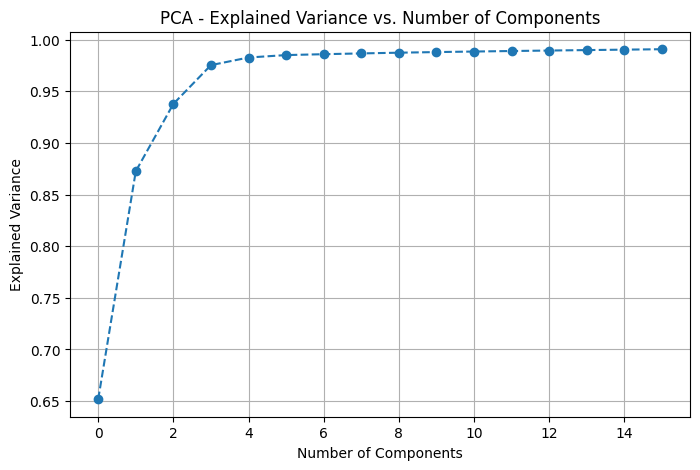

In [5]:

# Standardize the data (ensures that each feature (wavelength) has zero mean and unit variance)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Apply PCA (Reduce dimensions to 10 components)
pca = PCA(n_components=16)
X_pca = pca.fit_transform(X_scaled)

# Looking for an "elbow point" where the explained variance stops increasing significantly.
# Visualize explained variance
plt.figure(figsize=(8, 5))
plt.plot(np.cumsum(pca.explained_variance_ratio_), marker='o', linestyle='--')
plt.xlabel('Number of Components')
plt.ylabel('Explained Variance')
plt.title('PCA - Explained Variance vs. Number of Components')
plt.grid()
plt.show()


# SVM classifier

In [6]:
# Split into training and testing sets
X_train_pca, X_test_pca, y_train_pca, y_test_pca = train_test_split(X_pca, y, test_size=0.1, random_state=42, stratify=y)

# Train an SVM classifier
svm_model_pca = SVC(kernel='rbf', C=1.0, gamma='scale')
svm_model_pca.fit(X_train_pca, y_train_pca)

# Predict on the test set
y_pred = svm_model_pca.predict(X_test_pca)


In [7]:
# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.1, random_state=42, stratify=y)

# Train an SVM classifier
svm_model = SVC(kernel='rbf', C=1.0, gamma='scale')
svm_model.fit(X_train, y_train)

# Predict on the test set
y_pred_pca = svm_model.predict(X_test)

## Evaluation

Accuracy: 0.38


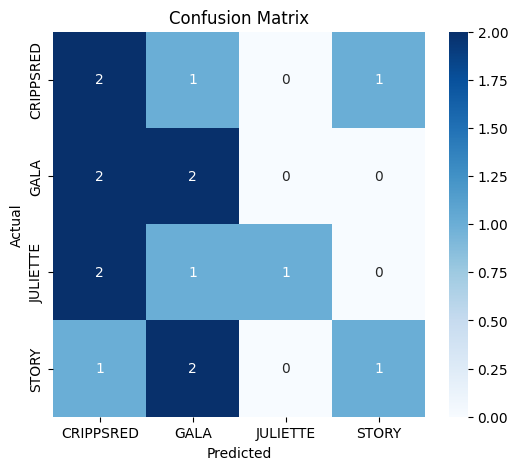

Classification Report:
              precision    recall  f1-score   support

   CRIPPSRED       0.29      0.50      0.36         4
        GALA       0.33      0.50      0.40         4
    JULIETTE       1.00      0.25      0.40         4
       STORY       0.50      0.25      0.33         4

    accuracy                           0.38        16
   macro avg       0.53      0.38      0.37        16
weighted avg       0.53      0.38      0.37        16



In [8]:

# Accuracy Score
accuracy_pca = accuracy_score(y_test_pca, y_pred_pca)
print(f"Accuracy: {accuracy_pca:.2f}")

# Confusion Matrix
cm_pca = confusion_matrix(y_test_pca, y_pred_pca)
plt.figure(figsize=(6, 5))
sns.heatmap(cm_pca, annot=True, cmap="Blues", fmt="d", xticklabels=apple_varieties.keys(), yticklabels=apple_varieties.keys())
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

# Classification Report
print("Classification Report:")
print(classification_report(y_test_pca, y_pred_pca, target_names=apple_varieties.keys()))


Accuracy: 0.38


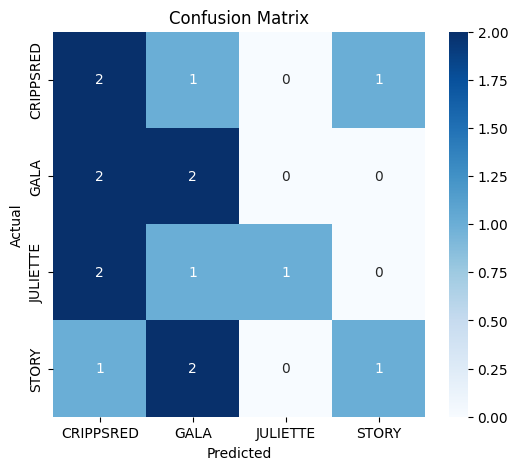

Classification Report:
              precision    recall  f1-score   support

   CRIPPSRED       0.29      0.50      0.36         4
        GALA       0.33      0.50      0.40         4
    JULIETTE       1.00      0.25      0.40         4
       STORY       0.50      0.25      0.33         4

    accuracy                           0.38        16
   macro avg       0.53      0.38      0.37        16
weighted avg       0.53      0.38      0.37        16



In [9]:

# Accuracy Score
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, cmap="Blues", fmt="d", xticklabels=apple_varieties.keys(), yticklabels=apple_varieties.keys())
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

# Classification Report
print("Classification Report:")
print(classification_report(y_test, y_pred, target_names=apple_varieties.keys()))


## Cross-validation

In [10]:
cv_scores_pca = cross_val_score(svm_model_pca, X_pca, y, cv=5)
print(f"Cross-Validation Accuracy: {cv_scores_pca.mean():.2f} ± {cv_scores_pca.std():.2f}")

Cross-Validation Accuracy: 0.57 ± 0.08


In [11]:
cv_scores = cross_val_score(svm_model, X_scaled, y, cv=5)
print(f"Cross-Validation Accuracy: {cv_scores.mean():.2f} ± {cv_scores.std():.2f}")

Cross-Validation Accuracy: 0.56 ± 0.08


# NN Classifier

In [12]:
num_classes = len(set(y_train_pca))
y_train_pca_cat = to_categorical(y_train_pca, num_classes)
y_test_pca_cat = to_categorical(y_test_pca, num_classes)

model_pca = Sequential([
    Dense(20, activation='relu', input_shape=(X_train_pca.shape[1],)),
    Dense(30, activation='relu'),
    Dense(len(set(y_train_pca)), activation='softmax')
])

model_pca.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])
model_pca.summary()


c:\Users\Feriel\Documents\UNI\Projet\spectrolux-main\python\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 20)             │           340 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 30)             │           630 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 4)              │           124 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,094 (4.27 KB)

 Trainable params: 1,094 (4.27 KB)

 Non-trainable params: 0 (0.00 B)

In [13]:
model_pca.fit(X_train_pca, y_train_pca_cat, epochs=50, batch_size=8, validation_data=(X_test_pca, y_test_pca_cat))


Epoch 1/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - accuracy: 0.2143 - loss: 2.0846 - val_accuracy: 0.1250 - val_loss: 1.6145
Epoch 2/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.3024 - loss: 1.6406 - val_accuracy: 0.1875 - val_loss: 1.3854
Epoch 3/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.4116 - loss: 1.2980 - val_accuracy: 0.3750 - val_loss: 1.3358
Epoch 4/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.5442 - loss: 1.1517 - val_accuracy: 0.3750 - val_loss: 1.3087
Epoch 5/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.4744 - loss: 1.1188 - val_accuracy: 0.3125 - val_loss: 1.2823
Epoch 6/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5226 - loss: 1.0318 - val_accuracy: 0.4375 - val_loss: 1.2554
Epoch 7/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.5320 - loss: 1.0345 - val_accuracy: 0.3125 - val_loss: 1.2157
Epoch 8/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.5925 - loss: 0.9246 - val_accuracy: 0.3750 - v

In [14]:
num_classes = len(set(y_train))
y_train_cat = to_categorical(y_train, num_classes)
y_test_cat = to_categorical(y_test, num_classes)

mlp = Sequential([
    Dense(20, activation='relu', input_shape=(X_train.shape[1],)),
    Dense(30, activation='relu'),
    Dense(len(set(y_train)), activation='softmax')
])

mlp.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])
mlp.summary()


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3 (Dense)                 │ (None, 20)             │         5,780 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 30)             │           630 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 4)              │           124 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,534 (25.52 KB)

 Trainable params: 6,534 (25.52 KB)

 Non-trainable params: 0 (0.00 B)

In [15]:
mlp.fit(X_train, y_train_cat, epochs=50, batch_size=8, validation_data=(X_test, y_test_cat))


Epoch 1/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - accuracy: 0.3798 - loss: 1.3526 - val_accuracy: 0.3750 - val_loss: 1.2775
Epoch 2/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.5069 - loss: 1.1460 - val_accuracy: 0.2500 - val_loss: 1.1871
Epoch 3/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.5589 - loss: 1.0417 - val_accuracy: 0.3125 - val_loss: 1.1893
Epoch 4/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6250 - loss: 0.9885 - val_accuracy: 0.2500 - val_loss: 1.2173
Epoch 5/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.6483 - loss: 0.9418 - val_accuracy: 0.3750 - val_loss: 1.1612
Epoch 6/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6762 - loss: 0.8165 - val_accuracy: 0.4375 - val_loss: 1.1440
Epoch 7/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.7793 - loss: 0.7704 - val_accuracy: 0.5000 - val_loss: 1.1343
Epoch 8/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.7795 - loss: 0.7683 - val_accuracy: 0.4375 - v

In [16]:
accuracy_pca = accuracy_score(y_test_pca, y_pred_pca)
print(f"NN with PCA Classification Accuracy: {accuracy_pca:.2f}")

NN with PCA Classification Accuracy: 0.38


In [17]:
accuracy = accuracy_score(y_test, y_pred)
print(f"NN Classification Accuracy: {accuracy:.2f}")

NN Classification Accuracy: 0.38


# 1D - CNN

In [44]:
from keras import regularizers
# Reshape for 1D CNN (samples, time steps, features)
X_reshaped = X_scaled[..., np.newaxis]

print("Original X shape: ", X.shape)
print("X scaled shape: ", X_scaled.shape)
print("X_reshaped shape: ", X_reshaped.shape)


# Encode labels
y_categorical = to_categorical(y)

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X_reshaped, y_categorical, test_size=0.2, random_state=42, stratify=y_categorical)

# Define 1D CNN model
model = Sequential([
    Conv1D(filters=32, kernel_size=3, activation='relu', input_shape=(X_reshaped.shape[1], 1)),
    MaxPooling1D(pool_size=2),
    Conv1D(filters=64, kernel_size=3, activation='relu'),
    MaxPooling1D(pool_size=2),
    Flatten(),
    #Dense(64, activation='relu', kernel_regularizer=regularizers.l2(0.01)),
    Dense(32, activation='relu'),
    Dropout(0.3),
    Dense(len(apple_varieties), activation='softmax')
])
model.summary()

Original X shape:  (160, 288)
X scaled shape:  (160, 288)
X_reshaped shape:  (160, 288, 1)


c:\Users\Feriel\Documents\UNI\Projet\spectrolux-main\python\.venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d_24 (Conv1D)              │ (None, 286, 32)        │           128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_23 (MaxPooling1D) │ (None, 143, 32)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_25 (Conv1D)              │ (None, 141, 64)        │         6,208 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_24 (MaxPooling1D) │ (None, 70, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_12 (Flatten)            │ (None, 4480)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_32 (Dense)                │ (None, 32)             │       143,392 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_12 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_33 (Dense)                │ (None, 4)              │           132 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 149,860 (585.39 KB)

 Trainable params: 149,860 (585.39 KB)

 Non-trainable params: 0 (0.00 B)

In [45]:
from tensorflow.keras.optimizers import Adam
optimizer = Adam(learning_rate=0.0001)
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
# Train the model
history = model.fit(X_train, y_train, epochs=300, batch_size=4, validation_data=(X_test, y_test))

Epoch 1/300
32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.2744 - loss: 1.3468 - val_accuracy: 0.3750 - val_loss: 1.3046
Epoch 2/300
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.3834 - loss: 1.2690 - val_accuracy: 0.4375 - val_loss: 1.2402
Epoch 3/300
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.4478 - loss: 1.1699 - val_accuracy: 0.4062 - val_loss: 1.2387
Epoch 4/300
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.4881 - loss: 1.1528 - val_accuracy: 0.4062 - val_loss: 1.2203
Epoch 5/300
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.4917 - loss: 1.1433 - val_accuracy: 0.4688 - val_loss: 1.1910
Epoch 6/300
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.5769 - loss: 1.0499 - val_accuracy: 0.5312 - val_loss: 1.1844
Epoch 7/300
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.5526 - loss: 1.0567 - val_accuracy: 0.5312 - val_loss: 1.1840
Epoch 8/300
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.5253 - loss: 1.1025 - val_accuracy: 0.50

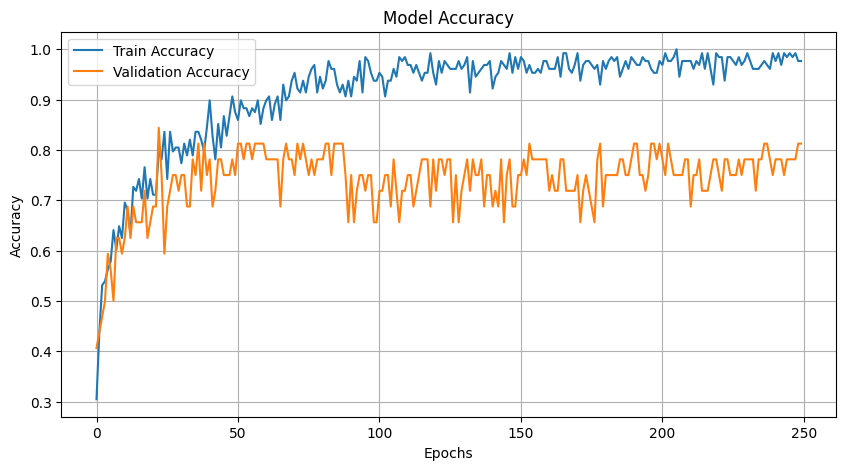

In [24]:
# Plot training history
plt.figure(figsize=(10, 5))
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title("Model Accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()
plt.grid(True)
plt.show()

In [21]:
# Ensure correct shape for CNN input
X_reshaped_pca = X_pca[..., np.newaxis]  # Shape: (samples, features, 1)

# Split data into train and test sets
X_train_pca, X_test_pca, y_train_pca, y_test_pca = train_test_split(
    X_reshaped_pca, y_categorical_pca, test_size=0.2, random_state=42, stratify=y_categorical_pca
)

# Adjust model
model_pca = Sequential([
    Conv1D(filters=32, kernel_size=2, activation='relu', input_shape=(X_pca.shape[1], 1)),  # Adjust kernel
    MaxPooling1D(pool_size=2),  # Remove if needed
    Conv1D(filters=64, kernel_size=2, activation='relu'),
    Flatten(),
    Dense(64, activation='relu'),
    Dropout(0.5),
    Dense(len(apple_varieties), activation='softmax')
])

# Train and evaluate
model_pca.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
history_pca = model_pca.fit(X_train_pca, y_train_pca, epochs=100, batch_size=8, validation_data=(X_test_pca, y_test_pca))

# Evaluate
test_loss_pca, test_acc_pca = model_pca.evaluate(X_test_pca, y_test_pca)
print(f"\nTest Accuracy: {test_acc_pca:.4f}")


NameError: name 'y_categorical_pca' is not defined

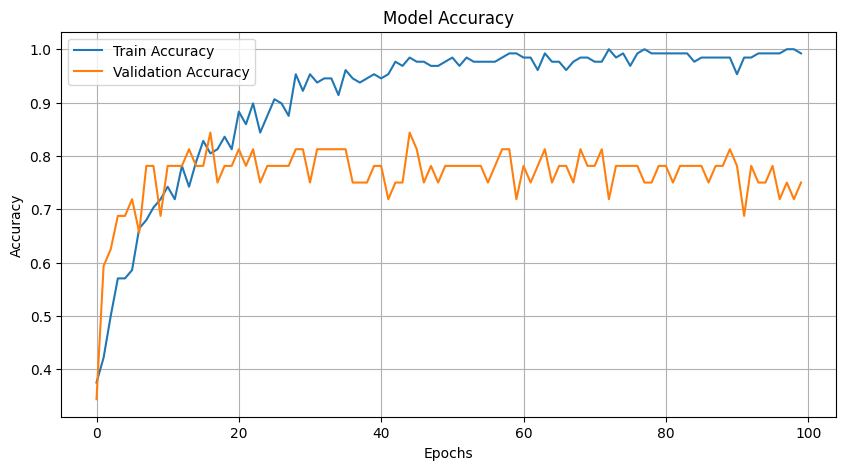

In [38]:
plt.figure(figsize=(10, 5))
plt.plot(history_pca.history['accuracy'], label='Train Accuracy')
plt.plot(history_pca.history['val_accuracy'], label='Validation Accuracy')
plt.title("Model Accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()
plt.grid(True)
plt.show()

In [72]:
# Try different numbers of principal components
n_components_range = range(1, X.shape[1] + 1)  # Up to number of features
cv_scores = []

for n in n_components_range:
    pca = PCA(n_components=n)
    X_pca = pca.fit_transform(X_scaled)


    scores = cross_val_score(model_pca, X_pca, y, cv=5, scoring='accuracy')
    cv_scores.append(scores.mean())

# Plot cross-validation scores
plt.figure(figsize=(8, 5))
plt.plot(n_components_range, cv_scores, marker='o')
plt.xlabel("Number of Principal Components")
plt.ylabel("Cross-Validation Accuracy")
plt.title("Optimal Number of PCA Components using Cross-Validation")
plt.grid()
plt.show()

# Find the best number of components
optimal_n = n_components_range[np.argmax(cv_scores)]
print(f"Optimal number of components: {optimal_n}")

TypeError: Cannot clone object '<Sequential name=sequential_6, built=True>' (type <class 'keras.src.models.sequential.Sequential'>): it does not seem to be a scikit-learn estimator as it does not implement a 'get_params' method.

In [ ]:
from scikeras.wrappers import KerasClassifier

from sklearn.model_selection import cross_val_score

def create_model():
    model = Sequential([
        Conv1D(filters=32, kernel_size=2, activation='relu', input_shape=(X_pca.shape[1], 1)),
        MaxPooling1D(pool_size=2),
        Conv1D(filters=64, kernel_size=2, activation='relu'),
        Flatten(),
        Dense(64, activation='relu'),
        Dropout(0.5),
        Dense(len(apple_varieties), activation='softmax')
    ])
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

# Wrap model for sklearn compatibility
model_pca = KerasClassifier(build_fn=create_model, epochs=10, batch_size=32, verbose=0)

# Perform cross-validation
scores = cross_val_score(model_pca, X_pca, y_categorical_pca, cv=5, scoring='accuracy')

print("Cross-validation scores:", scores)
print("Mean accuracy:", scores.mean())

AttributeError: 'super' object has no attribute '__sklearn_tags__'